<a href="https://colab.research.google.com/github/taesangeom/SK-T-Academy/blob/main/DL/InceptionNet/1_inceptionNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 견종 데이터셋!!!
# + kaggle 에서 어떻게 할지..
# ref : https://www.kaggle.com/c/dog-breed-identification
# ==> kaggle은 조별 플젝 하시면서, 한 번 직접 해보세요!!!!


In [ ]:
# 구글드라이브에 올려두고,,,링크만 걸어두겠습니다.
# train.zip, test.zip
!gdown https://drive.google.com/uc?id=1szLijK-O-QT5LA9ytCPassTtxMg-uJ_y
!gdown https://drive.google.com/uc?id=1z3n7y7RQKlseNBpb4XoRLKjTQGd8pExH


Downloading...
From (original): https://drive.google.com/uc?id=1szLijK-O-QT5LA9ytCPassTtxMg-uJ_y
From (redirected): https://drive.google.com/uc?id=1szLijK-O-QT5LA9ytCPassTtxMg-uJ_y&confirm=t&uuid=570d7290-bd2a-4b59-b293-a5fa89b4d98e
To: /content/train.zip
100% 361M/361M [00:05<00:00, 62.0MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1z3n7y7RQKlseNBpb4XoRLKjTQGd8pExH
From (redirected): https://drive.google.com/uc?id=1z3n7y7RQKlseNBpb4XoRLKjTQGd8pExH&confirm=t&uuid=1c136ca5-b851-416a-aea0-b5e1d5af26eb
To: /content/test.zip
100% 363M/363M [00:03<00:00, 110MB/s]


In [ ]:
# 샘플 submission, labels.csv 파일 다운로드
!gdown 1Iq0uGTax-qpAQbjdYrFPEJivoFLFc0bR
!gdown 1kKSzJISTf06tVccOwAC-1HEsdHzFKuwS

Downloading...
From: https://drive.google.com/uc?id=1Iq0uGTax-qpAQbjdYrFPEJivoFLFc0bR
To: /content/sample_submission.csv
100% 25.2M/25.2M [00:00<00:00, 140MB/s]
Downloading...
From: https://drive.google.com/uc?id=1kKSzJISTf06tVccOwAC-1HEsdHzFKuwS
To: /content/labels.csv
100% 482k/482k [00:00<00:00, 142MB/s]


In [ ]:
# colab/linux : zip 파일을 푸는 방식
# unzip -qq 풀려는대상 -d 압출풀경로
!unzip -qq '/content/train.zip' -d '/content/train/'

In [ ]:
# test.zip 압풀 파일을 /content/test/ 폴더에 풀어보세요!!!
!unzip -qq '/content/test.zip' -d '/content/test/'

In [ ]:
# 이 문제의 경우에는 120개의 견종으로 제한!!!!
# ++ 실문제 : 듣도보지도 못한 경우!!!!!!!

In [ ]:
# 제대로 풀렸늕지 확인!!!
import os
import glob

In [ ]:
len(list(glob.glob("/content/train/*.jpg")))

10222

In [ ]:
len(list(glob.glob("/content/test/*.jpg")))

10357

In [ ]:
# ---> 문제와 정답에 대해서 정형데이터로 만들기에는 불편!!!
#      폴더 구조를 통해서 이러한 정보들을 전달!!!!!!
# train폴더 안에 sub폴더명을 정답지의 이름으로 구성!!!!!!!!
#                sub폴더 안에는 그 견종에 대한 실제 이미지들...

# 예) 지금 상황
# train/~~~.jpg
#      /~~~~.jpg
# ==> 향후 폴더 구조를 통한 정답지 구성& 데이터셋 구성!!!!
# train/진돗개/~~~.jpg
#             /~~~.jpg
# train/요크서/~~~.jpg
#             /~!~~.jpg
# ==> 이미지 데이터셋들의 경우에 있어서는
#     어떻게 줄지는 그 떄 그 때 다름!!!!
#     이런 식으로 코드를 통해서 정답을 반영한 폴더 구조로 변경!!!

In [ ]:
# 폴더 기본 path를 설정!!!!
train_data_folder = "/content/train/"
test_data_folder = "/content/test/"

# ==> train --> 종류별로..
train_data_sub_folder = "/content/train_sub/"

In [ ]:
# 견종에 대한 하위 폴더에 대한 구성을 labels.csv를 기준으로 처리!!!
# ==> csv 파일에 대한 편의성을 위해서
import pandas as pd

In [ ]:
label_path = '/content/labels.csv'
label_text = pd.read_csv(label_path)
label_text.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# 체크1) 학습할 데이터의 정답의 수!!!
len(label_text.loc[:,"breed"].unique())
# --> 문서에서 제공하는 120견종에 대해서 모든 종류가 있구나!!!

120

In [ ]:
# 체크2) 각 종류별로 균형이 어느 정도 맞는지 체크!!!!!
# ==> 견종별로 몇 장의 데이터가 있는지.....
label_text.loc[:,"breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


In [ ]:
# ==> 견종별로 완벽하게 어비슷하게 학습데이터에 수집은 안 되어 있음!!!
#     통일을 66장을 선택..
#     데이터 증강을 120장으로 할 수 도...
#     모든 견종에 대해서 증강을 통해서,,,펌핑!!!!
#     : 여러분이 직접 선택을 해야 함!!!
#     +++ 시간과 비용에 대한 부분이 같이 따라옴!!!!
#     +++ 주어진 조건에 맞춰서 향후 진행 계획을 세워야 함!!!!!

In [ ]:
label_text.shape

(10222, 2)

In [ ]:
len(list(glob.glob("/content/train/*.jpg")))

10222

In [ ]:
# 데이터 탐색 & EDA
import matplotlib.pyplot as plt

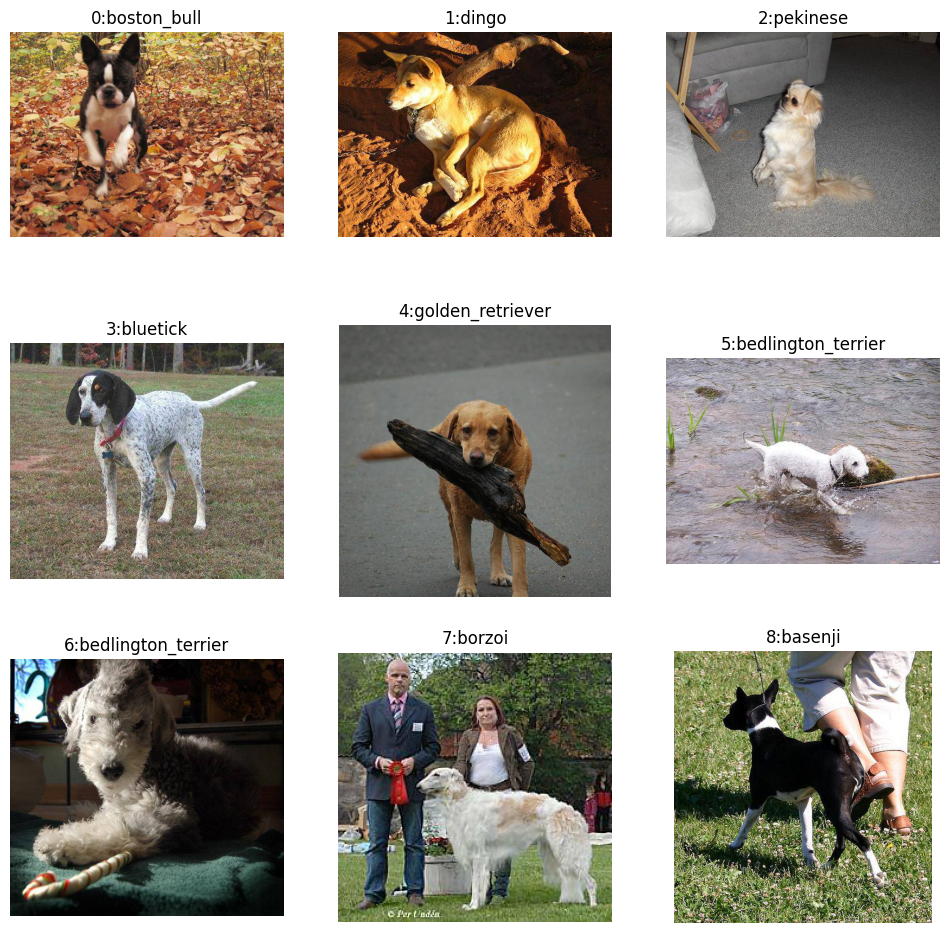

In [ ]:
plt.figure( figsize=(12,12))

for c in range(9):
    # 3 by 3 의 틀에다가 9개의 train 폴더 내의 샘플을 보려고 함!!
    # ==> 정답 df에서 해당 id를 가지고 와야 함.!!!
    image_id = label_text.at[c,"id"]
    image_breed = label_text.at[c,"breed"]

    # 9개를 그리기 위한 그림의 위치 :
    plt.subplot(3,3,c+1)

    # train폴더에서 해당하는 image_id의 이미지 파일을 가져
    image_file = train_data_folder + image_id + ".jpg"
    plt.imshow( plt.imread(image_file ))
    plt.title( str(c)+":"+image_breed)
    plt.axis("off")
plt.show()

In [ ]:
# EDA를 통해서,,,,
# 1) 일단 종에 대한 부분에서 색상 : 흑백은 좀.;...최대한 컬러!!!
# 2) 배경이 상당히 다양함.... ==> 견종에 대한 특징과
#                                 배경에 대한 특징이 혼재!!!
#    ==> segment 다른 알고리즘 + 이미지 전처리
#  정답이 없음!!!! 분석자가 스스로 판단 & 주어진 제약 조건!!!

In [ ]:
#### 우리가 할 문제 : 이미지를 분류!!!! 120개 여러
#    - 내가 직접 모델을 만들어서 할 수도 있고,,,
#    - 기존에 이미 잘 학습된 모델을 가지고 와서,,,,
#       +++ 견종에 대한 데이터셋으로 튜닝!!!
#    + 기타 최신 연구...........
####

In [ ]:
# DL을 중심으로 학습을 하려고 하니..
# ==> 이미지 데이터셋에 대해서 하위 폴더 구조로 ...
import os
import time
# colab 파일 보갓
import shutil

In [ ]:
# 파일 정리
# 1) train_sun폴더가 없으면 생성!!!!!!!!
train_data_sub_folder_name = os.path.dirname( train_data_sub_folder)
# 혹시 없는 폴더면,,,,생성을 해주세요!!!!!
if os.path.isdir( train_data_sub_folder_name) ==False:
    os.mkdir( train_data_sub_folder_name)

# 2) train_sub폴더가 생성이 되었다면,,,
# ===> 정답지 label.csv 파일을 돌려가면서,,
#      2-1) 해당하는 종에 대한 하위 폴더가 없다면,,
#           : 해당한 견종 이름으로 하위 폴더 생성!
#           : train에서 그 이미지를 가져다고 이 하위폴더에 복사.이동
#      2-2) 해당하는 종에 대한 하위 폴더가 이미 있다면,,,
#           : 그 폴더 위치만,,,,
#           : 그 하위 폴더 위치에 train에서 가져다고 복사/이동...

for i in range( len(label_text)):
    # 각 정답 샘플별로,,id. breed 정보
    image_id = label_text.at[i,"id"] # --> 이미지
    image_breed = label_text.at[i,"breed"] # --> 하위폴더 체크/생성

    # 견종별로 하위 폴더에 대한 경로를 조립!!!!
    if os.path.exists( train_data_sub_folder + image_breed) ==False:
        os.mkdir( train_data_sub_folder + image_breed)
    # ==> 정답지를 보고, 정답에 대한 하위 폴더가 없으면 생성!!!

    # 기존 train 폴더에서 견종에 맞는 하위 폴더로/이동 복사...
    # 복사 : 무엇을 ---> 어디로,,,,
    # /content/train/1111.jpg
    # --> /content/train_sub/허스키/1111.jpg
    shutil.copy(
        train_data_folder + image_id + ".jpg",
        train_data_sub_folder + image_breed
    )

In [ ]:
# 참고) 동일한 코드인데,,,
#       기준이 되는 폴더가 구글 드라이브면,,,시간 엄청 걸립니다!!!
# ==> 이미 풀어서 zip 구글 드라이브에 업로드/백업/
#

In [ ]:
# 체크: 내가 생성한 정답 관련 하위 폴더의 수가 120개가 맞늦지 체크!!!
len(os.listdir(train_data_sub_folder))

120

In [ ]:
# ===> 주어진 train 데이터에 대한 정답지 처리를 폴더 구조로 완료!!!!!

In [ ]:
# ===> 전처리 + 정답지에 대한 처리!!!!( 폴더 구조 )

In [ ]:
##################################################

In [ ]:
# 2단계 : 이 파일 구조를 기반으로 모델에 적용!!!!!!
# +++ generator!!!! [+ 외부 모듈을 사용하는 경우도!!! ]

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# 참고 링크 : https://keras.io/api/applications/
# ==> 1. 직접 논문 보고 구현!!!!
#     2. 위의 keras 이미 학습된 모델을 차용!!!( 차용 방식...)
#     3. yolo 다른 외부 모델을 활용!!!!
#     4. github+ 논문

# inceptionv3
# 이번 목적 : 2번을 중심으로 진행을 하려고 함!!!!!!
# +++ 기존 차용하려는 모델과 나의 모델의 목적 다름!!!!
#     기존 : 일반적인 이미지 1000종류에 대한 분류!!!!
#     나의 튜닝 : 강아지 이미지 120견종 분류!!!!
#      ==> 뒤에 분류에 대한 부분을 수정을 좀 해야하겠구나!!!!!
# +++ 사전 학습된 친구의 입력 데이터 : 224 224 3

In [ ]:
# 모태가 모델 : inception v3
from keras.applications.inception_v3 import InceptionV3
from keras.layers import Input

In [ ]:
# ==> inception v3 같은 경우에서는 imagenet 1000종류 학습!!!!
# ==> output을 수정!!!!!!

# include_top : 뒤쪽....목적에 대한 이미지 분류 1000종류!!!!
#               가지고 올 때 필요가 없음!!!

# 원래 데이터 : 224,224, 3으로 학습!!!!
# input에서는 지정을 하지 않으면,,, X, X, 3(컬러이미지)
# ==> 뒤에 알아서 조절을 함!!!!!!

In [ ]:
base_model = InceptionV3( weights="imagenet", include_top =False)
base_model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, None, None, 32) │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, None, None, 32) │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, None, None, 32) │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, None, None, 32) │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, None, None, 32) │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, None, None, 32) │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, None, None, 64) │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, None, None, 64) │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, None, None, 64) │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, None, None, 64) │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, None, None, 80) │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, None, None, 80) │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, None, None, 80) │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, None, None,     │        138,240 │ activation_3[0][0]     │
│                           │ 192)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, None, None,     │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │ 192)                   │                │                        │
├──────────────────────

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [ ]:
# 설계한 모델의 시각적인 부분
from tensorflow.keras.utils import plot_model

In [ ]:
plot_model( base_model, show_shapes=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.627048 to fit



In [ ]:
# 잘 학습된 모델 구조와 가중치를 가지고 옴!!!!!!
# ==> 활용하는 방식은 case by case!!!!
#     분석자가 스스로 정해야 함!!! Try!!!

In [ ]:
# m1) 애가 잘 했을꺼야,,,,그냥 사용하자!!!
for layer in base_model.layers:
    layer.trainable=False
# ==> imagenet 일반적인 이미지들에서 잘 추출을 했으니,,,
#    멍멍이 사진에 대한 특징을 잘 추출하겠지!!!!!
#    : 멍멍이 120종에 맞도록 뒤에 분류 네트워크만 학습& 수정하자!!!
# ==> pos : 학습할 파라미터가 적어지게 됨!!!
#     neg : 특징 추출이 dog으로 포커스가 안 되어 있어서,,성능;;;

In [ ]:
# m2) 구조가 좋으니까,,내 멍멍이 데이터로 처음부터 끝까지 다 학습!!!
#     껍데기만 차용!!!!! & 시작점을 imagenet 기반으로 출발!!!
for layer in base_model.layers:
    layer.trainable=True
# ==> imagenet 내 멍멍이하고 달러!!!
#     처음부터 끝까지 멍멍이로 완전 싹 다시 학습할래!!!
# ==> pos : 멍멍이 특화 특징 추출부터 분류까지!!!!
#     neg : 엄청난 학습 시간.......비용......

In [ ]:
# m3) 앞에는 일반적인 이미지들에 대해서 잘 학습을 했을 것이니..
#     믿고 갑시다!!!!
#     중간에 특징을 멍멍이로 다시 튜닝을 해서 분류에 활용하자!!!
#     뒤쪽 모듈은 직접 멍멍이로 학습하자!!!!
#     예 : inception 2번째 덩어리 : 249번째 layers!!!
for layer in base_model.layers[:249]:
    layer.trainable=False
for layer in base_model.layers[249:]:
    layer.trainable=True

In [ ]:
# ===> 참고 : 시간 관계상 분류만 학습을 시키겠습니다..
for layer in base_model.layers:
    layer.trainable=False

In [ ]:
# ===> 기존 모델을 어떻게 활용할지에 대한 세팅!!!!!!
# + 나의 목적에 맞도록 모델의 구조를 더 추가!!!!
# 1) 앞단 : 이미지 입력에 --> DataGenerator~~~~~: 폴더구조...
# 2) 출력 : 견종 120개 분류!!!

In [ ]:
# 최종 분류에 대한 종류...
num_classes = len( os.listdir( train_data_sub_folder))
num_classes

120

In [ ]:
# 기존 특징 추출 모델의 output을 분류쪽의 네트워크 입력!!!
# ==> 기존 모델 변수에서 최종 출력만 가지고 오겠다..
x = base_model.output
print(x)
print(x.shape)

<KerasTensor shape=(None, None, None, 2048), dtype=float32, sparse=False, name=keras_tensor_310>
(None, None, None, 2048)


In [ ]:
# 모델 설계에 필요한 모듈!!!!!
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, MaxPooling2D
from keras import backend as K
#
from keras.layers import Activation
from keras import optimizers

from keras.applications.inception_v3 import preprocess_input

In [ ]:
# 기존에 모델의 출력을 x로 가지고,,,뒤에를 붙이겠습니다...
x = GlobalAveragePooling2D()(x)
x = Dropout(0.2)(x)
x = Dense(1024, activation="relu")(x)
x = Dropout(0.2)(x)
x = Dense(1024, activation="relu")(x)
x = Dropout(0.2)(x)
x = Dense(512, activation="relu")(x)
##### --> 분류에 대한 네트워크를 설계 : 함수적인 in.out

# 출력층에 대해서,,,
pred = Dense( num_classes, activation="softmax")(x)

# 전체적인 모델을 조립을 하겠습니다!!!!
# in : None, None, None, 3
model = Model( inputs = base_model.input,
              outputs = pred)

In [ ]:
plot_model(model, show_shapes=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.59661 to fit



In [ ]:
# 대회 : 최적화 옵션!!! --> lr
my_adam = optimizers.Adam( learning_rate=0.001,
                          beta_1 = 0.9,
                           beta_2 = 0.999)
# ===> 가장 크게 : lr
#      그 다음으로 세팅 : 최적화 방식에 대한 추가 옵션!!!!

In [ ]:
# 내가 만들 모델과 어떻게 학습할지에 대한 컴파일!!!
# 참고) 분류 --> 정답을 라벨인코딩 : OH
#                                  :그냥 사용하려면 loss: sparse_~~~
# 하위 폴더 구조로 하게 되면,,,,,sparse 안 해도 됨!!
#                                따로 정답에 대해서 신경 안 써도 됨!!!
model.compile(
    optimizer = my_adam,
    loss = "categorical_crossentropy",
    metrics = ["accuracy"]
)
# 참고 : 대회 지표인 log-loss로도 한 번 해보세요!!!

In [ ]:
# 참고) 이미 학습된 모델을가지고 와서 하실 때
# ===> 이미 전처리들에 대한 과정도,,,같이 고민을 해야함!!!
# 혹시, inceptionv3가 수행한 전처리르 그대로 하겠다...
# import process_input 모둘을 불러ㅏ다가 사용하시면 됨...

In [ ]:
# 폴더에 있는 데이터를 중심으로 이미지 보강을 처리!!!!!
train_datagen = ImageDataGenerator(
    # 기존 모델이 inception v3 전처리르 그대로,,
    #processing_function = process_input

    ##########################################
    validation_split = 0.1,
    rescale = 1./255. ,
    # train/val에 대한 generator를 만들 때 고민/ 주의!!!!
    ##########################################

    # 데이터 보강
    rotation_range = 40,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.2,
    #
    fill_mode="nearest"
)

valid_datagen = ImageDataGenerator(
    validation_split = 0.1,
    rescale = 1./255. ,
)
# ==> 이미지 보강이나, 처리에 있어서 신경을 안 쓰면,,
#     중간 평가 valid이 난도가 높은 평가를 해야해서,,
#     성능이 안 나올 수 있음!!!!

In [ ]:
# 밑에서 폴더 구조상에서 해당하는 위에 generator로 뽑아내야하는데,
# --> 1. 이미지 사이즈...
image_size = 299
# --> 2. batch_size : GPU의 RAM을 체크!!!!!!!!
batch_size = 512 # v100
# batch_size = 16 # T4

In [ ]:
# ==> 구체적으로 어디서 해당하는 데이터를 생성할지!!!
train_generator = train_datagen.flow_from_directory(
    # 1장을 뽑을떄의 옵션,,,
    # 1) 어디서 뽑아올지...
    train_data_sub_folder,
    # 2) 이 데이터의 용도..
    subset = "training",
    # 3) 입력에 대한 모양을 여기서 지정!!!--> 선택...
    target_size = (image_size,image_size),
    # 4) 기타옵션!!!
    seed = 42,
    shuffle = True,
    batch_size = batch_size,
    class_mode = "categorical"
)
valid_generator = valid_datagen.flow_from_directory(
    train_data_sub_folder,
    subset = "validation",
    target_size = (image_size,image_size),
    seed = 42,
    shuffle = False, # --> 순서에 대해서 어찌할지에....
    batch_size = batch_size,
    class_mode = "categorical"
)

Found 9254 images belonging to 120 classes.
Found 968 images belonging to 120 classes.


In [ ]:
9254+968

10222

In [ ]:
# ==> 폴더 구조상의 데이터를 학습을 하기 위해서
#     모델에 밀어넣기 위한 데이터셋으로 가공!!!
#     + 전처리 + 데이터 보강!!!!!!

In [ ]:
# callback -->  CP/ ES
cp_path ="training/cp-{epoch:04d}.weights.h5"
cp_dir = os.path.dirname(cp_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    cp_path,
    verbose= 1,
    save_weights_only=True
)
es_callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience = 10,
)

In [ ]:
# 불과 1달 전만 하다라도,,,
# generator로 데이터셋을 형성을 하면,,
# fir_generator() : 구글링을 하면,,거의  이 메서드로!!!!!!!
# ==> fit으로 통합을 했습니다....
history = model.fit(
    # 학습할 데이터 셋 ---> 학습할 데이터 제너레이터...
    train_generator,
    # 중간에 평가 valid 셋 /비율 -->  중간 평가할 데이터 제너레이터
    validation_data = valid_generator,

    # epoch 지정!!!!!
    epochs = 3, #--> 크게하고,,ES으로 중간 정산을 하면 됨!!!!!
    # 참고 : 예전 fit_generator : stpes_per_epcoh~~~
    #        굳이 신경 안 쓰고,,,,,,
     callbacks = [cp_callback,es_callback ]
)

Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1388 - loss: 4.2287
Epoch 1: saving model to training/cp-0001.weights.h5
19/19 ━━━━━━━━━━━━━━━━━━━━ 291s 9s/step - accuracy: 0.1472 - loss: 4.1843 - val_accuracy: 0.8006 - val_loss: 0.8070
Epoch 2/3
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6622 - loss: 1.2380 
Epoch 2: saving model to training/cp-0002.weights.h5
19/19 ━━━━━━━━━━━━━━━━━━━━ 177s 6s/step - accuracy: 0.6635 - loss: 1.2323 - val_accuracy: 0.8275 - val_loss: 0.5723
Epoch 3/3
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7261 - loss: 0.9314
Epoch 3: saving model to training/cp-0003.weights.h5
19/19 ━━━━━━━━━━━━━━━━━━━━ 177s 6s/step - accuracy: 0.7263 - loss: 0.9312 - val_accuracy: 0.8481 - val_loss: 0.5137


In [ ]:
# +++ 위의 기본적인 사항을 바탕으로
#     본인들이 더 다양한 실험을 하실수 있고,
#     최적화 같은 부분도 더 하실 수 있음!!!
# =============> 최종 모델을 생성했다고 가정하고 진행을
# +++ 개인적으로 이 부분을 더 하셔야 함!!!!!!

In [ ]:
#### Test 데이터셋에 직접 풀어보려고 함!!!
#    ==> 최적의 모델을 선택!!!!
#    ==> test 폴더에 있는 문제를 풀어야 함!!!!
#        ( 120개 견종들에 대한 확률 )

In [ ]:
# 방식1) test 풀 문제에 대해서 generator를 통해서 생성!!!
#        ==> 주의!!!!!!!
test_datagen = ImageDataGenerator(
    rescale = 1./255.
)
test_generator = test_datagen.flow_from_directory(
    # train 정답이 없는 부분....
    # / content /
    #           / test /
    #                   aaa.jpg
    #                   bbb.jpg
    directory = "/content",
    classes = ["test"],

    # 공통적인 입력 이미지 크기 처리
    target_size = (image_size, image_size),
    # 기타
    class_mode = "categorical",
    shuffle = False,
    batch_size = batch_size
)
##### 혹시 시험 문제의 순서가 변경될 수 있어서,,,
test_generator.reset()

##### test 문제를 풀어보려고 함!!!!
output = model.predict( test_generator )

Found 10357 images belonging to 1 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step


In [ ]:
output.shape

(10357, 120)

In [ ]:
# 문제를 풀었는데,,,,120개의 순서,,,,,
train_generator.class_indices

{'affenpinscher': 0,
 'afghan_hound': 1,
 'african_hunting_dog': 2,
 'airedale': 3,
 'american_staffordshire_terrier': 4,
 'appenzeller': 5,
 'australian_terrier': 6,
 'basenji': 7,
 'basset': 8,
 'beagle': 9,
 'bedlington_terrier': 10,
 'bernese_mountain_dog': 11,
 'black-and-tan_coonhound': 12,
 'blenheim_spaniel': 13,
 'bloodhound': 14,
 'bluetick': 15,
 'border_collie': 16,
 'border_terrier': 17,
 'borzoi': 18,
 'boston_bull': 19,
 'bouvier_des_flandres': 20,
 'boxer': 21,
 'brabancon_griffon': 22,
 'briard': 23,
 'brittany_spaniel': 24,
 'bull_mastiff': 25,
 'cairn': 26,
 'cardigan': 27,
 'chesapeake_bay_retriever': 28,
 'chihuahua': 29,
 'chow': 30,
 'clumber': 31,
 'cocker_spaniel': 32,
 'collie': 33,
 'curly-coated_retriever': 34,
 'dandie_dinmont': 35,
 'dhole': 36,
 'dingo': 37,
 'doberman': 38,
 'english_foxhound': 39,
 'english_setter': 40,
 'english_springer': 41,
 'entlebucher': 42,
 'eskimo_dog': 43,
 'flat-coated_retriever': 44,
 'french_bulldog': 45,
 'german_shepherd'

In [ ]:
# 샘플로 제출양식을 참고해서 실제 kaggle에 제출할 OMR카드!!!

In [ ]:
df_submission = pd.read_csv("/content/sample_submission.csv")
df_submission.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333


In [ ]:
df_submission.shape

(10357, 121)

In [ ]:
id_list = []
# ==> 내가 푼 test 기준으로 어떤 문제들을 풀었는지
for f_path in test_generator.filenames:
    #print(f_path)
    # test를 본 파일에 대한 파일명만 필요함!!!!
    f_full_name = os.path.basename( f_path) # 앞에 경로 제거
    f_name = os.path.splitext(f_full_name)[0]
    #print(f_full_name,f_name)
    id_list.append(f_name)

In [ ]:
id_list[:3]

['000621fb3cbb32d8935728e48679680e',
 '00102ee9d8eb90812350685311fe5890',
 '0012a730dfa437f5f3613fb75efcd4ce']

In [ ]:
# ==> 샘플 양식에서 내가 test를 푼 문제 번호 순서대로,,
#    갈아끼고,,그것에 대한 정답들을 csv 에 기록!!!!! df
df_submission["id"] = id_list
df_submission.iloc[:,1:] = output
df_submission.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,5.711434e-05,1.047173e-05,8.955686e-07,1.082813e-06,1.026858e-06,2.196829e-06,1.816320e-07,1.725064e-06,2.136203e-06,...,1.622728e-06,2.326308e-05,0.000003,2.601953e-06,6.205227e-07,7.247713e-08,0.000005,2.704172e-06,1.272039e-06,5.780252e-07
1,00102ee9d8eb90812350685311fe5890,5.760950e-07,3.068021e-07,1.741189e-07,1.983073e-08,8.562573e-07,7.275022e-08,1.992282e-06,4.786980e-07,7.932850e-07,...,6.546271e-07,2.415132e-07,0.000002,8.943350e-07,3.894033e-07,4.165073e-07,0.000026,7.942577e-07,6.923822e-07,4.551542e-08
2,0012a730dfa437f5f3613fb75efcd4ce,7.909702e-06,5.491589e-02,6.722282e-04,1.285660e-04,1.250270e-04,4.206263e-04,7.561943e-06,1.684895e-04,2.643051e-04,...,5.404468e-06,2.402524e-04,0.000156,2.237763e-03,4.972518e-04,1.658429e-04,0.000057,6.168240e-04,5.423262e-04,1.614159e-04
3,001510bc8570bbeee98c8d80c8a95ec1,8.872892e-03,4.177507e-05,1.576412e-05,1.787667e-06,7.065982e-04,2.003213e-05,2.476108e-06,3.865745e-05,2.578978e-05,...,4.035183e-05,2.273255e-04,0.000348,3.767472e-05,2.887965e-05,5.323602e-07,0.000030,8.236837e-04,2.251831e-06,8.834995e-06
4,001a5f3114548acdefa3d4da05474c2e,8.541237e-03,1.373940e-04,7.108339e-06,4.315559e-06,1.049832e-05,4.735109e-05,5.629216e-06,1.233439e-05,8.124576e-06,...,1.932182e-05,5.087001e-05,0.000038,2.767626e-05,8.760015e-06,1.473386e-06,0.000021,7.154924e-05,8.041548e-06,1.691236e-04


In [ ]:
# ==> DF을 csv로 출력을 해셔 kaggle에 업로드를 하시면 됨!!!!!!!!!!!
#     제출 기한의 텀/// 여러 시도들 하시면 됨!!!!

In [ ]:
#### test 문제들에 대해서 체크1!!!!!! ####

In [ ]:
test_img_list = list(glob.glob("/content/test/*.jpg"))
test_img_list[:3]

['/content/test/f62187f85c6b9c519a4fae8bc22762da.jpg',
 '/content/test/ed3b2e79859710376b7a91379234b1ec.jpg',
 '/content/test/8c7e7873890d76ec2ad67d1b3e363e74.jpg']

In [ ]:
classes = {index:breed for breed, index in train_generator.class_indices.items()}
columns_names = [classes[i] for i in range(120)]
columns_names

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
test_img_list[:9]

['/content/test/f62187f85c6b9c519a4fae8bc22762da.jpg',
 '/content/test/ed3b2e79859710376b7a91379234b1ec.jpg',
 '/content/test/8c7e7873890d76ec2ad67d1b3e363e74.jpg',
 '/content/test/1275db6de36ab20a71d3f631085821c2.jpg',
 '/content/test/ccaaacb28d0f5d18cbd02145743497b5.jpg',
 '/content/test/492c1ecc6dee91c3251766eeadd4ad9d.jpg',
 '/content/test/7aabe5292269dd6399487579d2628a6e.jpg',
 '/content/test/daae98da21995398da6a10df3650ed26.jpg',
 '/content/test/2bdca185a02abac8142b0188afa32360.jpg']

In [ ]:
import cv2
import numpy as np

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


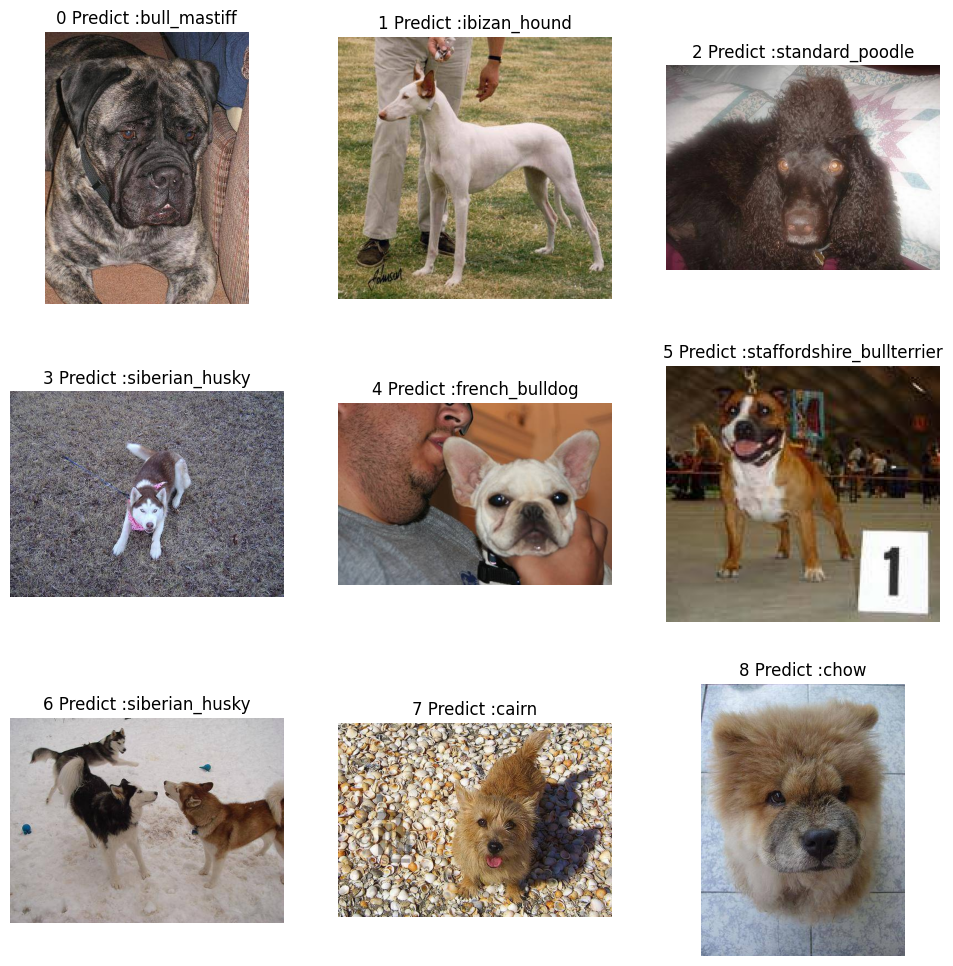

In [ ]:
# 실제 test 9 장에 대해서 보려고 합니다.
plt.figure( figsize=(12,12))

for c, test_img_path in enumerate( test_img_list[:9]):
    # 9개를 그리기 위한 그림의 위치 :
    plt.subplot(3,3,c+1)
    # test 이미지를 그리는 부분..
    plt.imshow( plt.imread(test_img_path))

    # opencv를 기반으로도 해보겠습니다...
    # ==> 이미 푼 ouputs에서 찾아도 되는데,,,
    #     구체적으로 하려고 할 때 적용하는 방식을 설명,,,
    curImg = cv2.imread( test_img_path ) # BGR --> 처리!!
    curImg = cv2.resize(curImg, (image_size, image_size) )
    # 명확하게 array!!!!!
    curImg = np.array( [ curImg/255.0 ])
    curImg_pred = model.predict( curImg ) # 출력 120 확률!!!
    # 확률이 제일 높은 견종이!!!! np.argmax()
    pred_breed = columns_names[ np.argmax(curImg_pred )]

    plt.title( str(c)+" Predict :"+pred_breed)
    plt.axis("off")
plt.show()

In [ ]:
# ===> 체크 사항!!!
# 1) 시험 문제들이 이미지의 크기들이 제각각!!
#    : 일괄적으로 정사각형으로 이미지크기를 조절!!!!!
#      왜곡현상이 발생할 수 있음!!!!
#    : +++ 리사이즈 왜곡 현상을 어떻게 할지!!!!! + 기본적인 영상처리opencv
# 2) 강아지만 탐색을 하려는데,,,,배경!!!!!!!
#    : 왜곡될 수 있는 배경을 어떻게 할지!!!!!
#    :segmenet 누끼를 따서,,,멍멍이들만 학습을 !!!!!!
#    : segment 여러 모델을 활용할 수 있음!!!!
# 3) 데이터를 증강할 때 처리 옵션!!!!!
# etc!!!!!
# 4) 여러 모델을 활요할 수 있음..ensemble!!!!!!!

# ==> 본인들의 생각대로 실험을 해보시고, kaggle 업로드!!!


### 과제 ###
# 1. 본인 스타일로 코드를 정리를 하세요!!!
# 2. 실제 업로드를 해보시면서,,모델의 성능을 향상!!!!
#    : 구글 드라이브에 본인 등수 + 본인 채점 기준에 의한 점수(kaggle채점한 점수)
#      사용한 코드 + 모델weights

############
# 기한 : 11월 4일 정도
# 제일 성능이 좋은 신 분에게 : 스타벅스 카드( 5만~10만)


# +++ yolo etc
# 방식은 open 재주것!!!!!

In [ ]:
# + kaggle : yolo를 활용해서 어떻게 재학습을 할지!!!!!!!

In [ ]:
# ResNet --> AE(복원, 생성) + gan
# +++ U-Net
# --- RNN + LSTM + Transformer!!!!!! ---> 여러 언어모델!!!!
#                  + vision
# ===================================== 논문을 볼 때 기본!!!!!!

# +++ 생성 diffusion: 확률분포에 대한 산수....
#   ////